In [2]:
!python -m pip install pyyaml==5.1
import sys, os, distutils.core
# Note: This is a faster way to install detectron2 in Colab, but it does not include all functionalities (e.g. compiled operators).
# See https://detectron2.readthedocs.io/tutorials/install.html for full installation instructions
!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))


import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)


fatal: destination path 'detectron2' already exists and is not an empty directory.


/home/jiayi/anaconda3/envs/mlcl/lib/python3.12/site-packages/torch/cuda/__init__.py:141: UserWarning: CUDA initialization: The NVIDIA driver on your system is too old (found version 10010). Please update your GPU driver by downloading and installing a new version from the URL: http://www.nvidia.com/Download/index.aspx Alternatively, go to: https://pytorch.org to install a PyTorch version that has been compiled with your version of the CUDA driver. (Triggered internally at ../c10/cuda/CUDAFunctions.cpp:108.)
  return torch._C._cuda_getDeviceCount() > 0
No CUDA runtime is found, using CUDA_HOME='/usr'


Ignoring dataclasses: markers 'python_version < "3.7"' don't match your environment
nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2019 NVIDIA Corporation
Built on Sun_Jul_28_19:07:16_PDT_2019
Cuda compilation tools, release 10.1, V10.1.243
torch:  2.2 ; cuda:  cu121


In [3]:
#install detectron2


# import some common libraries
import numpy as np
import os, json, cv2, random
#from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo

from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

matplotlib data path: /home/jiayi/anaconda3/envs/mlcl/lib/python3.12/site-packages/matplotlib/mpl-data
CONFIGDIR=/home/jiayi/.config/matplotlib
interactive is False
platform is linux
CACHEDIR=/home/jiayi/.cache/matplotlib
Using fontManager instance from /home/jiayi/.cache/matplotlib/fontlist-v330.json


In [5]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
#from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

Loaded backend module://matplotlib_inline.backend_inline version unknown.
Loaded backend module://matplotlib_inline.backend_inline version unknown.
findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=10.0.
findfont: score(FontEntry(fname='/home/jiayi/anaconda3/envs/mlcl/lib/python3.12/site-packages/matplotlib/mpl-data/fonts/ttf/DejaVuSerif-Bold.ttf', name='DejaVu Serif', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='/home/jiayi/anaconda3/envs/mlcl/lib/python3.12/site-packages/matplotlib/mpl-data/fonts/ttf/STIXSizTwoSymReg.ttf', name='STIXSizeTwoSym', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='/home/jiayi/anaconda3/envs/mlcl/lib/python3.12/site-packages/matplotlib/mpl-data/fonts/ttf/STIXNonUni.ttf', name='STIXNonUnicode', style='normal', variant='normal', weight=400, stretch='normal', size='

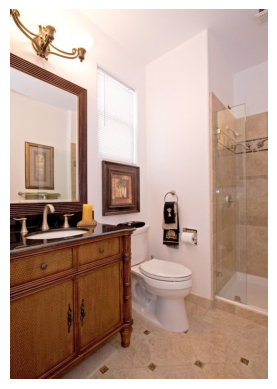

In [7]:
#get the images
#!python -m pip install google-colab
#from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
imageread=cv2.imread('/home/jiayi/ADE_bathroom/sub_train/ADE_train_00000007.jpg')
#cv2_imshow(imageread)
image_color=cv2.cvtColor(imageread, cv2.COLOR_BGR2RGB) 
# Display the image
plt.imshow(image_color)
plt.axis('off')
plt.show()

In [8]:
cfg = get_cfg()
# add project-specific config (e.g., TensorMask) here if you're not running a model in detectron2's core library
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model
# Find a model from detectron2's model zoo. You can use the https://dl.fbaipublicfiles... url as well
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")

#train with cpu
cfg.MODEL.DEVICE='cpu'

predictor = DefaultPredictor(cfg)
outputs = predictor(imageread)

[05/08 01:43:09 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from https://dl.fbaipublicfiles.com/detectron2/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl ...
URL https://dl.fbaipublicfiles.com/detectron2/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl cached in /home/jiayi/.torch/iopath_cache/detectron2/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl
[Checkpointer] Loading from /home/jiayi/.torch/iopath_cache/detectron2/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl ...
Reading a file from 'Detectron2 Model Zoo'


/home/jiayi/anaconda3/envs/mlcl/lib/python3.12/site-packages/torch/functional.py:507: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3549.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


In [9]:
# look at the outputs. See https://detectron2.readthedocs.io/tutorials/models.html#model-output-format for specification
print(outputs["instances"].pred_classes)
print(outputs["instances"].pred_boxes)

tensor([61, 71])
Boxes(tensor([[320.5055, 594.5309, 506.7292, 896.2540],
        [ 43.2114, 605.8062, 212.8896, 638.4401]]))


findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=10.799999999999999.
findfont: score(FontEntry(fname='/home/jiayi/anaconda3/envs/mlcl/lib/python3.12/site-packages/matplotlib/mpl-data/fonts/ttf/DejaVuSerif-Bold.ttf', name='DejaVu Serif', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='/home/jiayi/anaconda3/envs/mlcl/lib/python3.12/site-packages/matplotlib/mpl-data/fonts/ttf/STIXSizTwoSymReg.ttf', name='STIXSizeTwoSym', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='/home/jiayi/anaconda3/envs/mlcl/lib/python3.12/site-packages/matplotlib/mpl-data/fonts/ttf/STIXNonUni.ttf', name='STIXNonUnicode', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='/home/jiayi/anaconda3/envs/mlcl/lib/python3.12/site-packages/matplotlib/mpl-data/

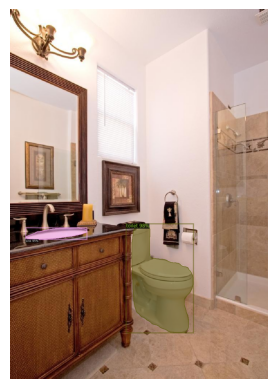

toilet
sink


In [10]:
# We can use `Visualizer` to draw the predictions on the image.
v = Visualizer(imageread[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
#show the image
#plt.imshow(out.get_image()[:, :, ::-1])
plt.axis('off')
plt.imshow(out.get_image())
#print the instance segmentation 
plt.show()
#store the class in one list from metadata
class_list=[]
for i in range(len(outputs["instances"].pred_classes)):
    class_list.append(MetadataCatalog.get(cfg.DATASETS.TRAIN[0]).thing_classes[outputs["instances"].pred_classes[i]])
    print(MetadataCatalog.get(cfg.DATASETS.TRAIN[0]).thing_classes[outputs["instances"].pred_classes[i]])




In [84]:
#get the class labels from the image and print them
print(MetadataCatalog.get(cfg.DATASETS.TRAIN[0]).thing_classes)



['person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush']


In [1]:
#read json files one by one from one folder


import json
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from detectron2.structures import BoxMode
from detectron2.data import DatasetCatalog, MetadataCatalog
import os
import json

folder_path = '/home/jiayi/ADE_bathroom/sub_train_json'  # Replace with the actual folder path

# Iterate over the files in the folder
for filename in os.listdir(folder_path):
    if filename.endswith('.json'):  # Check if the file is a JSON file
        file_path = os.path.join(folder_path, filename)
        with open(file_path, 'r') as file:
            json_data = json.load(file)
            print(json_data)

            # Process the JSON data here
            # ...






{'annotation': {'filename': 'ADE_train_00000008.jpg', 'folder': 'ADE20K_2021_17_01/images/ADE/training/home_or_hotel/bathroom', 'imsize': [1653, 1737, 3], 'source': {'folder': '/static_sun_database/b/bathroom', 'filename': 'sun_aauqnwburbyamyzc.jpg', 'origin': 'Downloaded from Google search. Image might be subject to copyright. Use only for non-commercial research and educational purposes.'}, 'scene': ['indoor', 'home or hotel', 'bathroom'], 'object': [{'id': 0, 'name': 'windowpane, window', 'name_ndx': 3055, 'hypernym': ['windowpane, window', 'pane, pane of glass, window glass', 'plate glass, sheet glass', 'sheet, flat solid', 'artifact, artefact', 'whole, unit', 'object, physical object', 'physical entity', 'entity'], 'raw_name': 'window', 'attributes': '', 'depth_ordering_rank': 1, 'occluded': [], 'crop': '0', 'parts': {'hasparts': [], 'ispartof': [], 'part_level': 0}, 'instance_mask': 'ADE_train_00000008/instance_000_ADE_train_00000008.png', 'polygon': {'x': [1314, 1308, 1736, 1734

In [50]:
DatasetCatalog.remove('bath1_sub_train')
MetadataCatalog.remove('bath1_sub_train')
DatasetCatalog.remove('bath1_sub_val')
MetadataCatalog.remove('bath1_sub_val')

In [51]:

from detectron2.structures import BoxMode
import json
import os
from detectron2.data import DatasetCatalog, MetadataCatalog
import numpy as np

classname=[]




def get_bathroom_dicts(img_dir):
    #dataset_dictsall = []
    dataset_dicts = []
    #json_file = img_dir +"/ADE_frame_00000040 (copy).json"
    for filename in os.listdir(img_dir):
     if filename.endswith('.json'):  # Check if the file is a JSON file
        file_path = os.path.join(img_dir, filename)
        #print(file_path)
        with open(file_path, 'r') as file:
            data = json.load(file)

            
        

            
            for key, value in data.items():
        

         
        # For each image annotation in the JSON
               if "annotation" in key:
                record = {}
            #check value contains the string filename and return the index
          
                filename = os.path.join(img_dir,value["filename"])
                #print(filename)
           
            
    
                height, width, _ = value["imsize"]
           

                record["file_name"] = filename
            
                record["height"] = height
                record["width"] = width
            

            # Annotation information
                objs = []
                for anno in value["object"]:
                 #print(anno)
                 if "polygon" in anno:
                    # Create a bounding box for each object
                    poly = anno["polygon"]
                    px = poly["x"]
                    py = poly["y"]
                    poly = [(x, y ) for x, y in zip(px, py)]
                    poly = [p for x in poly for p in x]
        
                    if anno["raw_name"] not in classname:
                        classname.append(anno["raw_name"])


                    value = {
                        "bbox": [np.min(px), np.min(py), np.max(px), np.max(py)],
                        "bbox_mode": BoxMode.XYXY_ABS,
                        "segmentation": [poly],
                        "category_id": classname.index(anno["raw_name"]),
                        
                        
                        #"iscrowd": 0,
                    }
                    #insert the class name into the list without repeating
                    
                    objs.append(value)
                    
                




            #print(objs)
            #print(classname)
                    

                record["annotations"] = objs
                #print(record)
                dataset_dicts.append(record)
                #print(dataset_dicts)
        #dataset_dictsall.append(dataset_dicts)
    print(len(classname))
        
    return dataset_dicts
    







            
#get_bathroom_dicts("/home/jiayi/ADE_bathroom/sub_train")
for d in ["sub_train", "sub_val"]:
    #getbathroom=get_bathroom_dicts("/home/jiayi/ADE_bathroom/" + d)
    
    DatasetCatalog.register("bath1_" + d, lambda d=d:get_bathroom_dicts("/home/jiayi/ADE_bathroom/" + d))

    
   
    
    #print("OK")
    MetadataCatalog.get("bath1_" + d).set(thing_classes=classname)
bath_metadata = MetadataCatalog.get("bath1_sub_train")
    #show the registered images

    #show the path for the   images
print(DatasetCatalog.get("bath1_sub_train"))




329
[{'file_name': '/home/jiayi/ADE_bathroom/sub_train/ADE_train_00002646.jpg', 'height': 512, 'width': 384, 'annotations': [{'bbox': [23, 372, 313, 512], 'bbox_mode': <BoxMode.XYXY_ABS: 0>, 'segmentation': [[119, 372, 24, 430, 23, 511, 304, 512, 313, 418]], 'category_id': 0}, {'bbox': [60, 320, 108, 348], 'bbox_mode': <BoxMode.XYXY_ABS: 0>, 'segmentation': [[92, 320, 108, 326, 108, 338, 81, 348, 65, 347, 60, 339, 64, 329]], 'category_id': 1}, {'bbox': [92, 405, 159, 477], 'bbox_mode': <BoxMode.XYXY_ABS: 0>, 'segmentation': [[114, 405, 137, 407, 150, 412, 156, 422, 159, 438, 152, 447, 150, 455, 149, 476, 112, 477, 92, 424, 98, 417, 105, 411]], 'category_id': 2}, {'bbox': [71, 368, 101, 387], 'bbox_mode': <BoxMode.XYXY_ABS: 0>, 'segmentation': [[81, 368, 99, 376, 101, 385, 94, 387, 90, 382, 74, 383, 71, 380, 72, 373]], 'category_id': 1}, {'bbox': [2, 494, 77, 511], 'bbox_mode': <BoxMode.XYXY_ABS: 0>, 'segmentation': [[3, 495, 25, 494, 47, 497, 65, 500, 77, 508, 77, 511, 2, 510]], 'categ

329
[{'file_name': '/home/jiayi/ADE_bathroom/sub_train/ADE_train_00002646.jpg', 'height': 512, 'width': 384, 'annotations': [{'bbox': [23, 372, 313, 512], 'bbox_mode': <BoxMode.XYXY_ABS: 0>, 'segmentation': [[119, 372, 24, 430, 23, 511, 304, 512, 313, 418]], 'category_id': 0}, {'bbox': [60, 320, 108, 348], 'bbox_mode': <BoxMode.XYXY_ABS: 0>, 'segmentation': [[92, 320, 108, 326, 108, 338, 81, 348, 65, 347, 60, 339, 64, 329]], 'category_id': 1}, {'bbox': [92, 405, 159, 477], 'bbox_mode': <BoxMode.XYXY_ABS: 0>, 'segmentation': [[114, 405, 137, 407, 150, 412, 156, 422, 159, 438, 152, 447, 150, 455, 149, 476, 112, 477, 92, 424, 98, 417, 105, 411]], 'category_id': 2}, {'bbox': [71, 368, 101, 387], 'bbox_mode': <BoxMode.XYXY_ABS: 0>, 'segmentation': [[81, 368, 99, 376, 101, 385, 94, 387, 90, 382, 74, 383, 71, 380, 72, 373]], 'category_id': 1}, {'bbox': [2, 494, 77, 511], 'bbox_mode': <BoxMode.XYXY_ABS: 0>, 'segmentation': [[3, 495, 25, 494, 47, 497, 65, 500, 77, 508, 77, 511, 2, 510]], 'categ

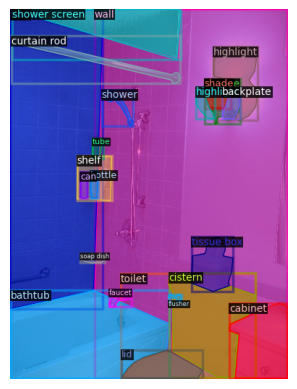

[{'file_name': '/home/jiayi/ADE_bathroom/sub_train/ADE_train_00002646.jpg', 'height': 512, 'width': 384, 'annotations': [{'bbox': [23, 372, 313, 512], 'bbox_mode': <BoxMode.XYXY_ABS: 0>, 'segmentation': [[119, 372, 24, 430, 23, 511, 304, 512, 313, 418]], 'category_id': 0}, {'bbox': [60, 320, 108, 348], 'bbox_mode': <BoxMode.XYXY_ABS: 0>, 'segmentation': [[92, 320, 108, 326, 108, 338, 81, 348, 65, 347, 60, 339, 64, 329]], 'category_id': 1}, {'bbox': [92, 405, 159, 477], 'bbox_mode': <BoxMode.XYXY_ABS: 0>, 'segmentation': [[114, 405, 137, 407, 150, 412, 156, 422, 159, 438, 152, 447, 150, 455, 149, 476, 112, 477, 92, 424, 98, 417, 105, 411]], 'category_id': 2}, {'bbox': [71, 368, 101, 387], 'bbox_mode': <BoxMode.XYXY_ABS: 0>, 'segmentation': [[81, 368, 99, 376, 101, 385, 94, 387, 90, 382, 74, 383, 71, 380, 72, 373]], 'category_id': 1}, {'bbox': [2, 494, 77, 511], 'bbox_mode': <BoxMode.XYXY_ABS: 0>, 'segmentation': [[3, 495, 25, 494, 47, 497, 65, 500, 77, 508, 77, 511, 2, 510]], 'category_

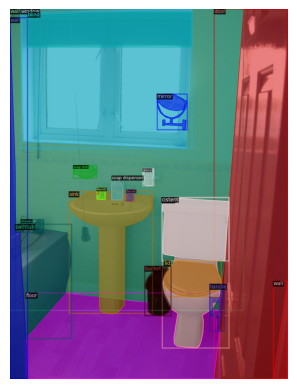

In [52]:
dget= get_bathroom_dicts("/home/jiayi/ADE_bathroom/sub_train")
#only read the img file
import random
import cv2
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
import matplotlib.pyplot as plt
#randomly select 2 images to sho
#only read the file with jpg format


for d in random.sample(dget, 2):
    print(dget)
    print(d["file_name"])
    
    img = cv2.imread(d["file_name"])
    #check the image path for cv2.imread.
    
    
    visualizer = Visualizer(img[:, :, ::-1], metadata=MetadataCatalog.get("bath1_sub_train"), scale=0.5)
    print(d)
    vis = visualizer.draw_dataset_dict(d)
    plt.imshow(vis.get_image()[:, :, ::-1])
    plt.axis('off')
    plt.show()
   
    
    

In [53]:
import os

folder_path = "/home/jiayi/ADE_bathroom/sub_train"
filename = "ADE_train_00000006.jpg"
file_path = os.path.join(folder_path, filename)

if os.path.exists(file_path):
    img = cv2.imread(file_path)
    # Proceed with image processing or visualization
else:
    print(f"Error: Image file '{file_path}' does not exist")

In [57]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer

cfg = get_cfg()

cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("bath1_sub_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2  # This is the real "batch size" commonly known to deep learning people
cfg.SOLVER.BASE_LR = 0.001  # pick a good LR
cfg.SOLVER.MAX_ITER = 10000    # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # The "RoIHead batch size". 128 is faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 329   # only has one class (ballon). (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
cfg.MODEL.DEVICE='cpu'
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[05/16 02:28:12 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (330, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (330,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (1316, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (1316,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due to incompatible shapes: (80, 256, 1, 1) in the checkpoint but (329, 2

[05/16 02:28:13 d2.engine.train_loop]: Starting training from iteration 0
[05/16 02:29:00 d2.utils.events]:  eta: 6:05:38  iter: 19  total_loss: 8.371  loss_cls: 5.726  loss_box_reg: 0.8484  loss_mask: 0.6928  loss_rpn_cls: 0.9776  loss_rpn_loc: 0.1982    time: 2.2375  last_time: 2.1990  data_time: 0.0197  last_data_time: 0.0009   lr: 1.9981e-05  
[05/16 02:29:45 d2.utils.events]:  eta: 6:04:54  iter: 39  total_loss: 7.715  loss_cls: 5.239  loss_box_reg: 0.8759  loss_mask: 0.6917  loss_rpn_cls: 0.7317  loss_rpn_loc: 0.2407    time: 2.2200  last_time: 2.3973  data_time: 0.0050  last_data_time: 0.0029   lr: 3.9961e-05  
[05/16 02:30:30 d2.utils.events]:  eta: 6:07:10  iter: 59  total_loss: 5.914  loss_cls: 3.968  loss_box_reg: 0.8821  loss_mask: 0.6887  loss_rpn_cls: 0.3635  loss_rpn_loc: 0.2362    time: 2.2296  last_time: 2.1909  data_time: 0.0037  last_data_time: 0.0009   lr: 5.9941e-05  
[05/16 02:31:15 d2.utils.events]:  eta: 6:09:33  iter: 79  total_loss: 4.107  loss_cls: 2.003  los

In [58]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

[05/16 12:21:21 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


342


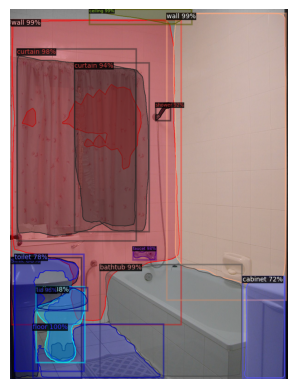

Instance 1:
  Bounding Box: [300, 0, 804, 72]
  Category ID: 9
  Category Name: ceiling
  Confidence: 0

Instance 2:
  Bounding Box: [0, 1, 726, 1403]
  Category ID: 8
  Category Name: wall
  Confidence: 0

Instance 3:
  Bounding Box: [713, 0, 1198, 1214]
  Category ID: 8
  Category Name: wall
  Confidence: 0

Instance 4:
  Bounding Box: [1021, 1145, 1197, 1597]
  Category ID: 22
  Category Name: cabinet
  Confidence: 0

Instance 5:
  Bounding Box: [423, 1101, 1021, 1599]
  Category ID: 0
  Category Name: bathtub
  Confidence: 0



In [67]:
from detectron2.utils.visualizer import ColorMode
dataset_dicts = get_bathroom_dicts("/home/jiayi/ADE_bathroom/sub_val")
for d in random.sample(dataset_dicts, 5):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata=bath_metadata, 
                   scale=0.5, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    #v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
#show the image
#plt.imshow(out.get_image()[:, :, ::-1])
plt.axis('off')
plt.imshow(out.get_image())
#print the instance segmentation 
plt.show()
import numpy as np

# Get the annotations from the dictionary
annotations = d['annotations']

# Sort the annotations based on the confidence scores in descending order
annotations.sort(key=lambda x: x.get('score', 0), reverse=True)

# Print the top 5 predicted instances
for i in range(5):
    annotation = annotations[i]
    bbox = annotation['bbox']
    category_id = annotation['category_id']
    confidence = annotation.get('score', 0)
    category_name = classname[category_id]
    
    print(f"Instance {i+1}:")
    print(f"  Bounding Box: {bbox}")
    print(f"  Category ID: {category_id}")
    print(f"  Category Name: {category_name}")
    print(f"  Confidence: {confidence}")
    print()

#store the class in one list from metadata
# `






   